# Boundary Harmonization

A common issue in spatial analysis is that geographic tabulation units can (and often do) change over time. For instance the U.S. census boundary polygons like tracts and blocks are re-drawn with each census to accomodate population growth and change. That means it's impossible to see if tract XZY has changed over time because "tract XYZ" means something different in each time period. To help solve that problem geosnap leverages the pysal [`tobler`](https://pysal.org/tobler) package to harmonize spatial boundaries over time. Doing so is as simple as calling the `harmonize()` function

## Original Data

First, we'll create a new Community from San Diego county

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from geosnap import DataStore
from geosnap import analyze as gaz
from geosnap import io as gio
from geosnap import visualize as gvz
from geosnap.harmonize import harmonize

datasets = DataStore()

In [2]:
%load_ext watermark
%watermark -a 'eli knaap' -d -u -iv

Author: eli knaap

Last updated: 2024-01-16

pandas    : 2.1.4
geosnap   : 0.12.1.dev9+g3a1cb0f6de61.d20240110
matplotlib: 3.8.2
geopandas : 0.14.1



Using the `from_census` constructor, we'll grab some original census data which by default, includes data from 1990, 2000, and 2010 and adjusts all currency columns for inflation by converting them into 2015 dollars (if you want to suppress this behavior set `constant_dollars=False`). Here's how median contract has changed in San Diego county if we plot maps of the original boundaries

In [3]:
sd = gio.get_census(datasets, county_fips="06073", currency_year=2019)

In [4]:
sd_acs = gio.get_acs(datasets, county_fips="06073", years=[2020], level="tract", currency_year=2019)

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/io/constructors.py:215: UserWarning: Currency columns unavailable at this resolution; not adjusting for inflation
  warn(


In [5]:
sd_acs = sd_acs.to_crs(6426)

In [6]:
sd = sd.to_crs(6426)

In [7]:
sd = gpd.GeoDataFrame(pd.concat([sd, sd_acs]))

There are several different harmonization techniques in the literature (for a deeper dive on spatial interpolation checkout the `tobler` library) but nearly all of them require good estimates of source and target polygon areas. That means it's important to set a reasonable CRS for the study region (which should be a familiar habit anyway). In this case, [epsg 6246](https://epsg.io/6246) is appropriate

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


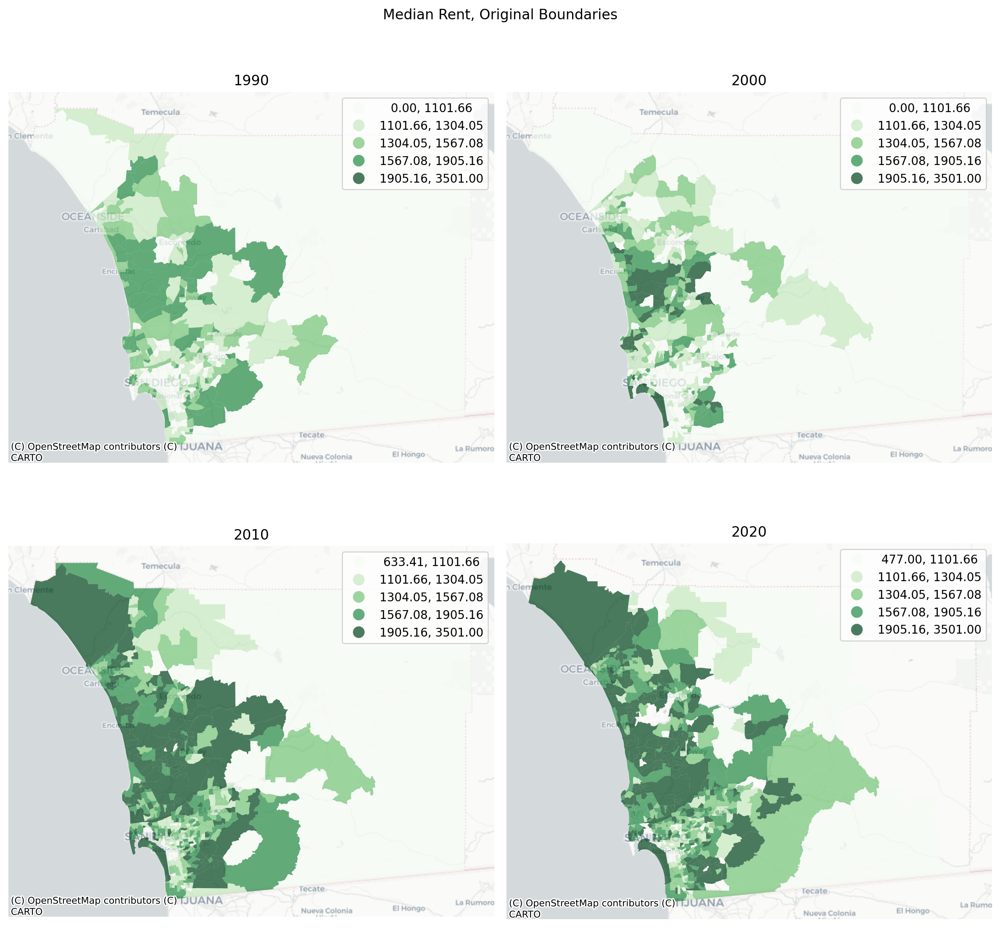

In [8]:
gvz.plot_timeseries(
    sd,
    "median_contract_rent",
    title="Median Rent, Original Boundaries",
    cmap="Greens",
    dpi=200,
    figsize=(12, 12),
    nrows=2,
    ncols=2,
)
plt.tight_layout()

It looks like San Diego county has gotten dramatically more expensive over time, particularly through the 2000s. But since the underlying geographic units are changing over time, we still can't make tract-to-tract comparisons, so we can harmonize the boundaries. Here we'll take each census year and convert population and median income data into constant boundaries from the 2020 census. 

## Harmonization using Areal Interpolation

The simplest way to harmonize boundaries is to use areal interpolation, meaning we use the area of overlap between consecutive years to create a weighted sum of intersecting polygons. This approach assumes each polygon has constant density of each attribute so its most useful when the polygons are small and homogenous

When harmonizing boundaries over time, we need to distinguish between [intensive and extensive](https://en.wikipedia.org/wiki/Intensive_and_extensive_properties) variables because each needs to be handled differently during the interpolation process. Median income is a statistic (so intensive), whereas total population is a count (extensive), so we make sure to pass each to the appropriate list

In [9]:
sd_harm20 = harmonize(
    sd,
    intensive_variables=["median_contract_rent", "p_hispanic_persons"],
    extensive_variables=["n_total_pop"],
    weights_method="area",
    target_year=2020,
)

/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Converting 3 time periods:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


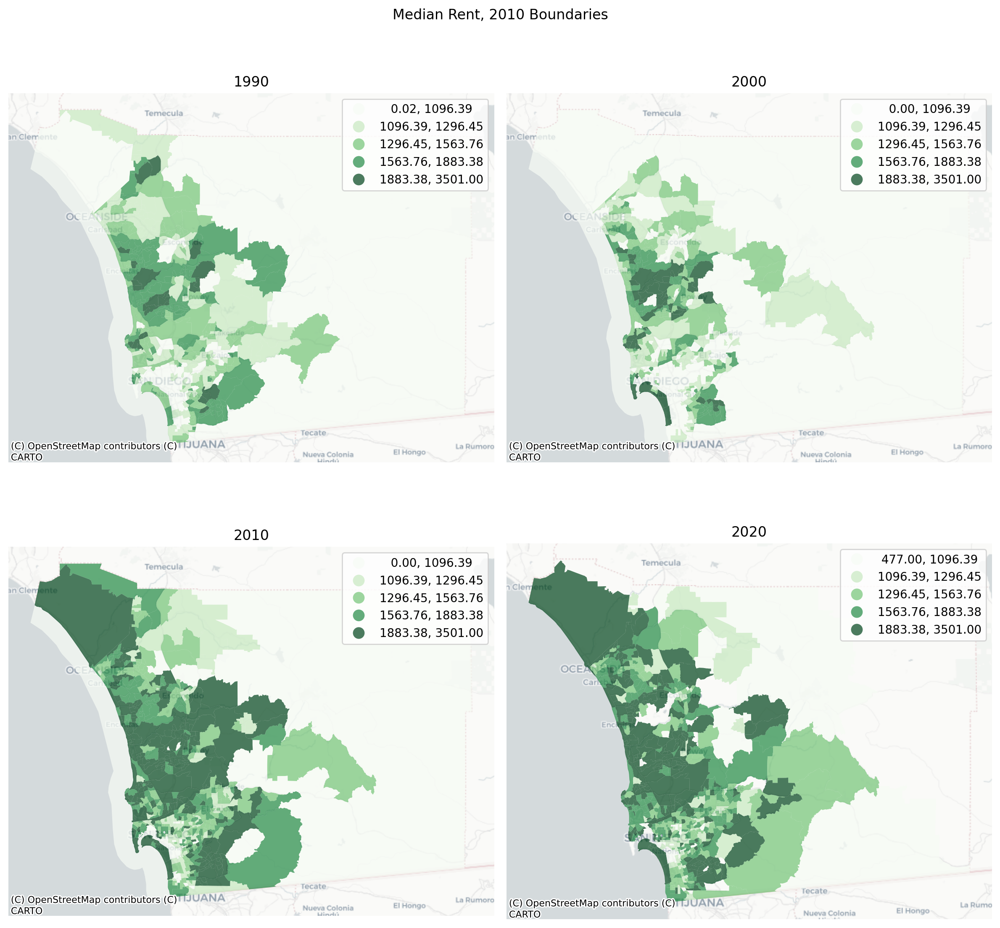

In [10]:
gvz.plot_timeseries(
    sd_harm20,
    "median_contract_rent",
    title="Median Rent, 2010 Boundaries",
    cmap="Greens",
    dpi=200,
    figsize=(12, 12),
    nrows=2,
    ncols=2,
)
plt.tight_layout()

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


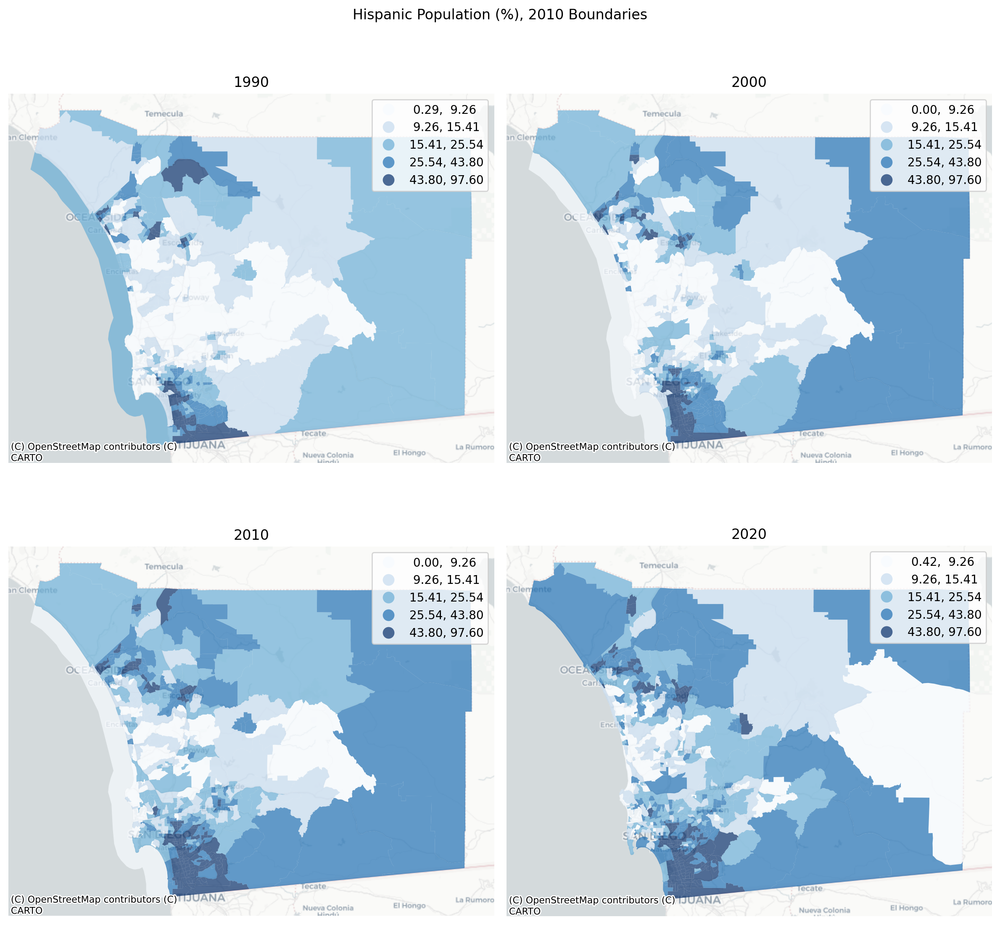

In [11]:
gvz.plot_timeseries(
    sd_harm20,
    "p_hispanic_persons",
    title="Hispanic Population (%), 2010 Boundaries",
    dpi=200,
    figsize=(12, 12),
    nrows=2,
    ncols=2,
)
plt.tight_layout()

We could also use 1990 boundaries as our target to see how the region has evolved according to those units:

/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Converting 3 time periods:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


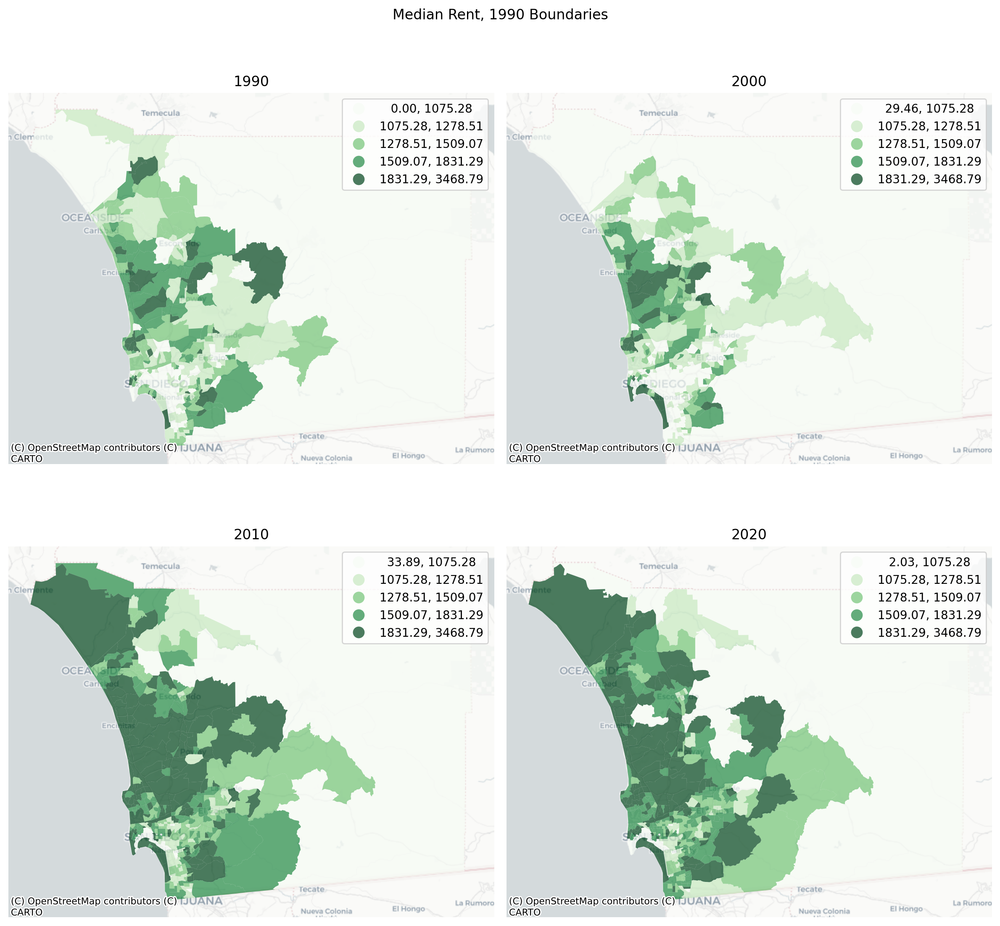

In [12]:
sd_harm90 = harmonize(
    sd,
    intensive_variables=["median_contract_rent"],
    weights_method="area",
    target_year=1990,
)

gvz.plot_timeseries(
    sd_harm90,
    "median_contract_rent",
    title="Median Rent, 1990 Boundaries",
    cmap="Greens",
    dpi=200,
    figsize=(12, 12),
    nrows=2,
    ncols=2,
)
plt.tight_layout()

## Harmonization using Dasymetric Interpolation

To account for the fact that most variables are not distributed uniformly thoughout the polygon (e.g. development is often clustered rather than spread evenly throughout each census tract), geosnap can use [dasymetric interpolation](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6420221/) that incorporates additional information for a more accurate harmonization. In this case, we can use raster data like [the NLCD](https://www.mrlc.gov/) to constrain our interpolation to only the developed part of each census tract.

[oturns](https://spatial.ucr.edu) distributes an optimized version of the NLCD data through its [quilt bucket](https://open.quiltdata.com/b/spatial-ucr) for use in harmonization so we can download it simply using quilt. Since we're harmonizing boundaries from the past, our auxiliary data should roughly match the time period of the polygon data we're converting. The earliest version of the NLCD available is 2001, so we'll use that



To use dasymetric harmonization, we need to change the `weights_method` and provide a path to a valid raster file (which, in this case, we just downloaded to th current dir). When using a raster file as a dasymetric mask, we need to tell the function which raster cells are part of the mask. In this case, the pixels in the NLCD raster to different land use types, and we want to constrain the interpolation to developed land. So here we'll set the `pixel_values` argument to the developed land types from the nlcd: 

- 22 (Developed, Low Intensity)
- 23 (Developed, Medium Intensity) 
- 24 (Developed, High Intensity)


Note: dasymetric interpolation is much more data intensive so it takes considerably longer to calculate. On my machine it takes roughly 90 seconds per time period for this study area, whereas the pure areal interpolation completes in a few seconds each. Ninety seconds is still pretty impressive in this case, given that the raster file is ~1.5gb and is being read directly from the web.

In [13]:
sd_harm10_dasy = harmonize(
    sd,
    intensive_variables=["median_contract_rent"],
    weights_method="dasymetric",
    raster="https://spatial-ucr.s3.amazonaws.com/nlcd/landcover/nlcd_landcover_2021.tif",
    pixel_values=[21, 22, 23, 24],
    target_year=2010,
)

/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Converting 3 time periods:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwa

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


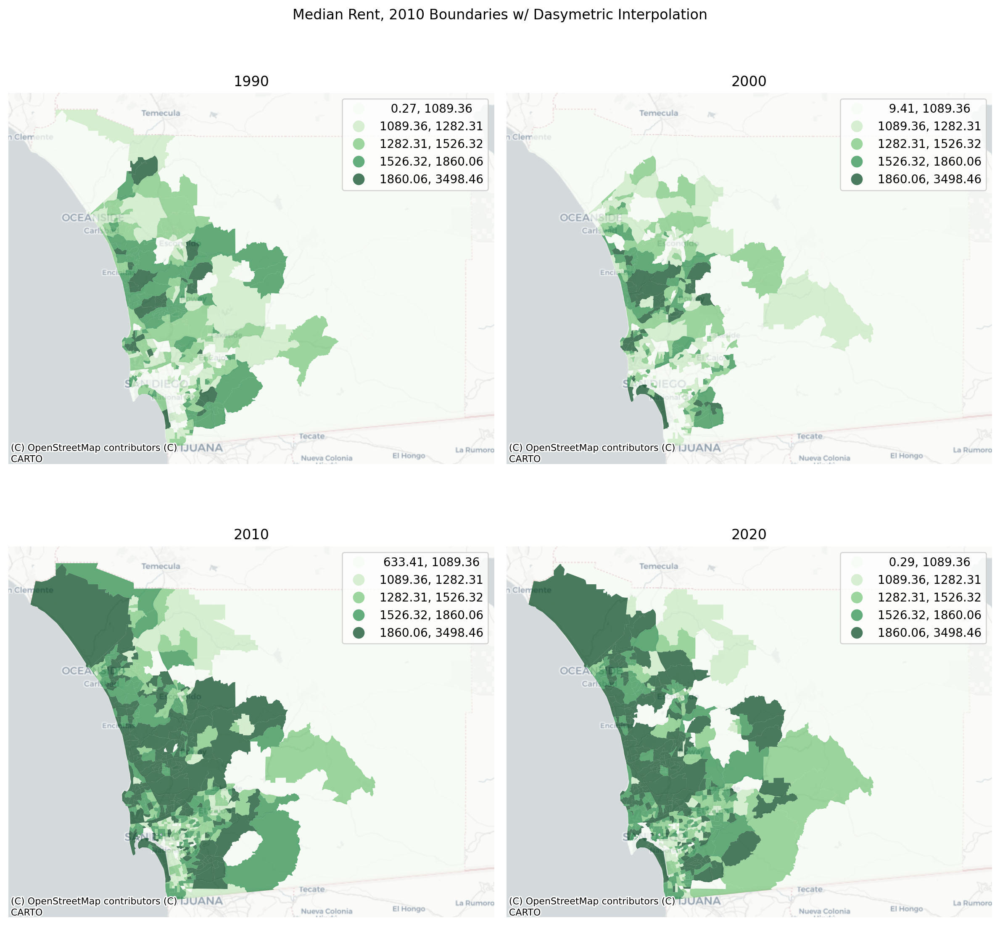

In [14]:
gvz.plot_timeseries(
    sd_harm10_dasy,
    "median_contract_rent",
    title="Median Rent, 2010 Boundaries w/ Dasymetric Interpolation",
    dpi=200,
    cmap="Greens",
    figsize=(12, 12),
    nrows=2,
    ncols=2,
)
plt.tight_layout()

The NLCD is a useful dasymetric layer because it has high spatial resolution and classifies a relatively wide range of land uses. By constraining our interpolation to developed land uses we ensure that there are no variables allocated to obviously incorrect places like forests, lakes, or farms. But it doesnt do anything to prevent allocating variables to  developed land uses that don't have population--like heavy industry, airports, parking lots, or shopping malls. Depending on the particular problem and location, you may want to inclue or exclude different pixel types. There may also be better raster sources that could be used as alternatives

## Harmonizing to an Alternate Geographic Unit

In some cases, it can be useful to discard the original boundaries altogether and instead harmonize all time periods to a consistent geographic unit defined elsewhere (like a school district, or congressional district, or a regular hexgrid)

In [15]:
from tobler.util import h3fy

Note you need the `h3` libarary to run this cell, which might require `mamba install hy-py`

In [16]:
sd_hex = h3fy(sd[sd.year == 2010], resolution=7)

/Users/knaaptime/mambaforge/envs/geosnap/lib/python3.11/site-packages/pyproj/crs/crs.py:1293: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


<Axes: >

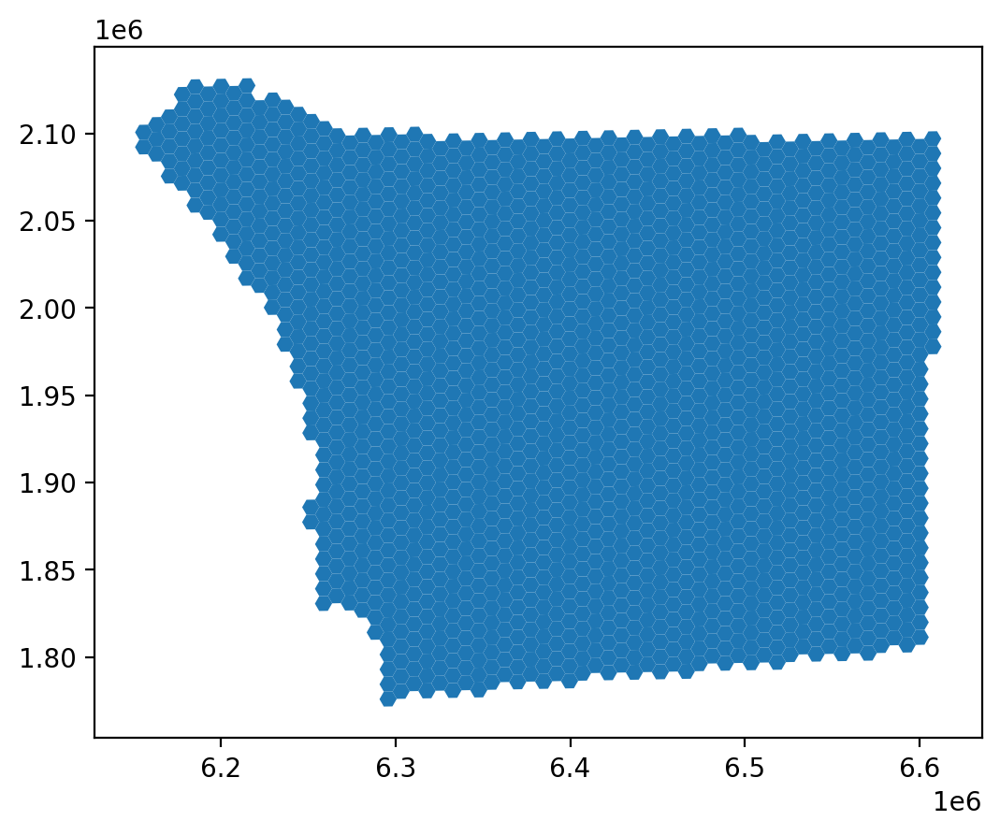

In [17]:
sd_hex.plot()

In [32]:
sd_hex_interp = harmonize(
    sd, target_gdf=sd_hex, intensive_variables=["median_contract_rent"]
)

Converting 4 time periods:   0%|          | 0/4 [00:00<?, ?it/s]

/Users/knaaptime/Dropbox/projects/geosnap/geosnap/visualize/mapping.py:170: UserWarning: `proplot` is not installed.  Falling back to matplotlib
  warn("`proplot` is not installed.  Falling back to matplotlib")


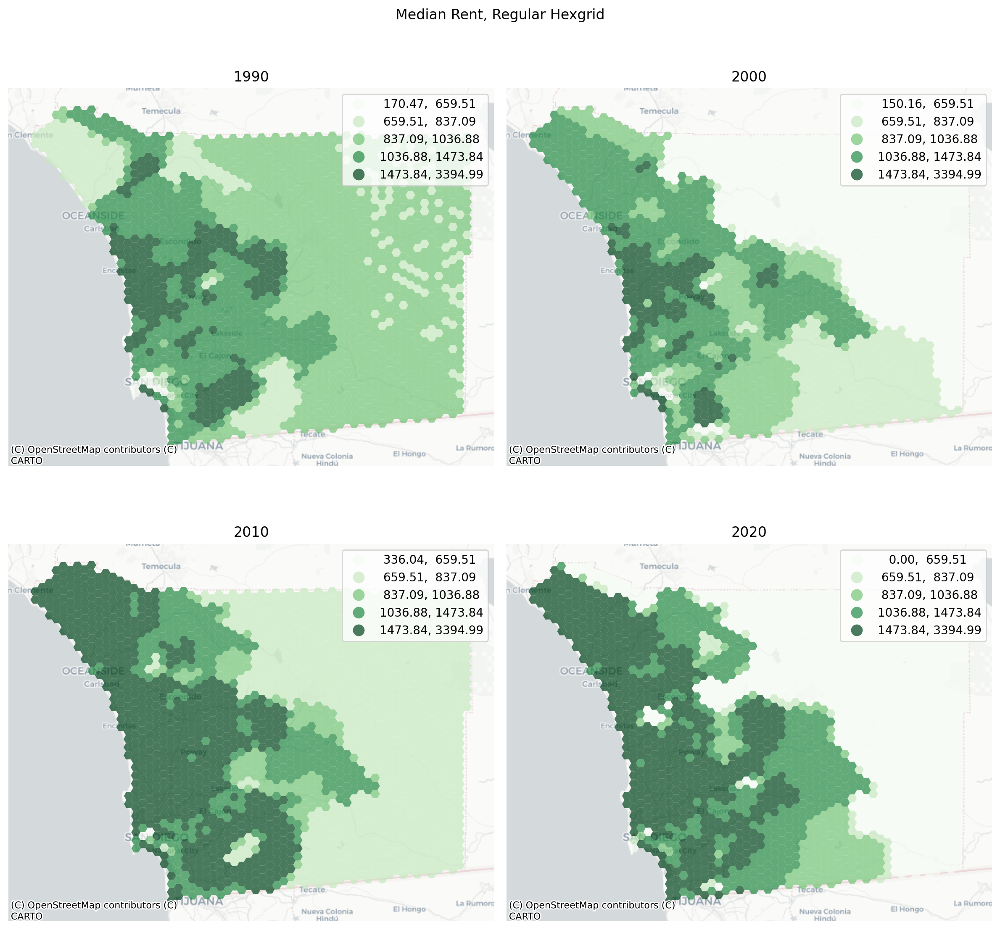

In [34]:
gvz.plot_timeseries(
    sd_hex_interp,
    "median_contract_rent",
    title="Median Rent, Regular Hexgrid",
    dpi=200,
    cmap="Greens",
    figsize=(12, 12),
    nrows=2,
    ncols=2,
)
plt.tight_layout()